# Module 4. Spatial relations
# Spatial joins

## Lecture objectives

1. Provide more practice with wrangling different datasets and regular joins
2. Explain more uses of `groupby`
3. Demonstrate how to do spatial joins in `geopandas`

Let's think about joins in a spatial setting. Let's grab the [California food pantry dataset](https://controllerdata.lacity.org/dataset/Food-Resources-in-California/v2mg-qsxf) and join it to the census data. The aim: analyze the demographics of neighborhoods with food pantries.

In [1]:
#displayというlibraryは基本的にはprintと同じだが、ちょっと高性能のもの
from IPython.display import display

import geopandas as gpd
import numpy as np
import pandas as pd
import requests
pantryDf = pd.read_csv('../data/Food_Resources_in_California.csv')
display(pantryDf.head())
print(pantryDf.columns)

,Name,Street Address,City,State,Zip Code,County,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
0,Agnes Memorial Church Of God In Christ,2372 International Boulevard,Oakland,CA,94601,Alameda,510-533-1101,Partners with the City of Oakland's Hunger Rel...,Food Pantry,http://agnesmemorialchurch.com,NaN,37.783047,-122.234238
1,Alameda County Community Food Bank,7900 Edgewater Drive,Oakland,CA,94621,Alameda,510-635-3663,Call our Helpline at: 1-800-870-FOOD (3663) or...,Food Bank,https://www.accfb.org/,NaN,37.741538,-122.201300
2,Salaam Food Pantry,4039 Irvington Avenue,Fremont,CA,94538,Alameda,415-860-2409,Provides non-perishable grocery bags for needy...,Food Pantry,http://salaamfoodpantry.org/,NaN,37.531391,-121.959689
3,Sierra Winds,10354 Argonaut Lane,Jackson,CA,95642,Amador,NaN,"Monday through Friday Lunch at Noon, (must att...",Food Pantry,http://www.feedamador.org/site/pages/get_help.cgi,NaN,38.358841,-120.789164
4,St Patrick's Hall,115 Court St,Jackson,CA,95642,Amador,NaN,"Thursday evenings, 5:00-7:00pm",Food Pantry,http://www.feedamador.org/site/pages/get_help.cgi,NaN,38.349870,-120.773385


Index(['Name', 'Street Address', 'City', 'State', 'Zip Code', 'County',
       'Phone', 'Description', 'Resource Type', 'Web Link', 'Notes',
       'Latitude', 'Longitude'],
      dtype='object')


It's a statewide dataset, but to keep things simple, let's limit to the county of Los Angeles.

In [2]:
#LAのデータだけを引き出す+上書き
pantryDf = pantryDf[pantryDf.County=='Los Angeles']

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> Examine the columns of the dataframe. Which ones contain spatial information?
</div>

While this is a regular csv file, there is spatial information in the `Latitude` and `Longitude` fields. The `gpd.points_from_xy()` function is ideal for creating geometries from these fields.

The geopandas documentation is fairly helpful. Note that while the `crs` argument (i.e., the projection) is optional, it's good practice to specify it.

In [3]:
#上のデータは単なるdataframe。lat,lonの列はあるが、単に列名がそうなっているだけで、中身はなんでも許される
#つまり、geometryのデータの列だとは認識されていない。なので、geo dataframeにするには、それがgeometryのデータだと標識しないといけない
#そのfunctionがgpd.points_from_xy
#以下のhelpを開くと、どういう風にcodeを書いてgeometryとしての標識をさせるかが書かれている
help(gpd.points_from_xy)

Help on function points_from_xy in module geopandas.array:

points_from_xy(x, y, z=None, crs=None)
    Generate GeometryArray of shapely Point geometries from x, y(, z) coordinates.

    In case of geographic coordinates, it is assumed that longitude is captured by
    ``x`` coordinates and latitude by ``y``.

    Parameters
    ----------
    x, y, z : iterable
    crs : value, optional
        Coordinate Reference System of the geometry objects. Can be anything accepted by
        :meth:`pyproj.CRS.from_user_input() <pyproj.crs.CRS.from_user_input>`,
        such as an authority string (eg "EPSG:4326") or a WKT string.

    Examples
    --------
    >>> import pandas as pd
    >>> df = pd.DataFrame({'x': [0, 1, 2], 'y': [0, 1, 2], 'z': [0, 1, 2]})
    >>> df
       x  y  z
    0  0  0  0
    1  1  1  1
    2  2  2  2
    >>> geometry = geopandas.points_from_xy(x=[1, 0], y=[0, 1])
    >>> geometry = geopandas.points_from_xy(df['x'], df['y'], df['z'])
    >>> gdf = geopandas.GeoDataFra

Let's do this and turn `pantryDf` into a new GeoDataFrame, called `pantrygdf`. Notice that a new column called `geometry` is added.

In [4]:
#geometry = geopandas.points_from_xy(df.longitude, df.latitude, crs="EPSG:4326")
#という形式でgeometryのcolumnを設定する
#pantryDfのLongitudeという列とpantryDfのLatitudeという列を使ってgeometryを設定して
#それをpantryDfに追加する、という指示
#EPSG:4326は数少ない覚えないといけない数字の1つ。特に深い意味はなく、lat,lonを設定するためのprojection
pantrygdf = gpd.GeoDataFrame(
    pantryDf, geometry=gpd.points_from_xy(pantryDf.Longitude, pantryDf.Latitude, 
                                          crs='EPSG:4326'))
pantrygdf.head()

,Name,Street Address,City,State,Zip Code,County,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude,geometry
315,Aids Project Los Angeles - Vance North Necessi...,3935 E. 10th St.,Long Beach,CA,90813,Los Angeles,(213) 201-1326,The program provides emergency food services a...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.779225,-118.146143,POINT (-118.14614 33.77922)
329,Aaron Community Cultural Center,1010-B W. 108th St.,Los Angeles,CA,90044,Los Angeles,(800) 527-4184,The agency provides employment services and sh...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.938011,-118.292446,POINT (-118.29245 33.93801)
330,Action Food Pantry,17880 E. Covina Blvd.,Covina,CA,91722,Los Angeles,(626) 319-0554,The organization provides emergency food for p...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.099089,-117.900356,POINT (-117.90036 34.09909)
331,"Aids Food Store , The",3935 E. 10th St.,Long Beach,CA,90804,Los Angeles,(562) 434-3425,The agency provides emergency food to people w...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.779225,-118.146143,POINT (-118.14614 33.77922)
332,Aids Project Los Angeles - Vance North Necessi...,611 S. Kingsley Dr.,Los Angeles,CA,90005,Los Angeles,(213) 201-1433,The program provides emergency food services a...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.062950,-118.303030,POINT (-118.30303 34.06295)


We can double check that the `crs` is to our satisfaction.

In [5]:
pantrygdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now let's map it. The basemaps are in Web Mercator projection by default, so we need to transform our data to that projection (`3857`). 

[]

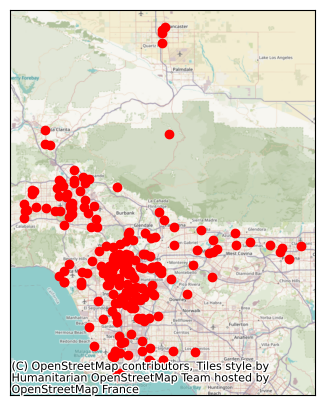

In [7]:
#contextilyというのは以前にも用いたbasemap。それはデフォルトでweb mercator projectionになっている
#なので、それに合うようにprojectionを変更しないといけない
import contextily as ctx
import matplotlib.pyplot as plt

# Create blank figure and axis objects
#地図を描くキャンバスと軸を設定
fig, ax = plt.subplots(figsize=(5,5))

# Plot the data. ax=ax means we plot it on the axes that we just created
#.to_crs('EPSG:3857')で、pantrygdfをWeb MercatorのprojectionであるEPSG:3857に変換
#.plot(color='r', ax=ax)で、そのデータをplot（プロットの色は赤、軸は上で設定したaxを使う）
pantrygdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=10)

# and we really don't need the axis ticks and labels, so we set them to an empty list
#xy軸の目盛は緯度経度を示してくれるが、その情報は不要なので削除する
ax.set_xticks([])
ax.set_yticks([])

<div class="alert alert-block alert-info">
    <strong>Exercise:</strong> What happens if you remove the <strong>to_crs</strong> part of the code? How can you explain what's going on?
</div>

### Merging with census and EnviroScreen data
The map is nice if we just want to look at the locations. But we can't do any analysis of how food pantry locations correlate with neighborhood characteristics.

To do that, let's load in our other data sources. First, we'll use the Census Bureau API to get the Census data.

In [8]:
# get the census tract level data
# this should be familiar to you from previous lectures
# we'll ask for table B19019_001E for LA county (FIPS code 037)
# note we ask for 2019 data to match the Enviroscreen boundaries
import requests
r = requests.get('https://api.census.gov/data/2019/acs/acs5?get=B19019_001E&for=tract:*&in=state:06%20county:037')
censusdata = r.json() #APIのレスポンスを JSON（辞書とリスト）形式で読み込む

#censusdataは以下のようなリストのリスト
#[
#    ['B19019_001E', 'state', 'county', 'tract'],   # ← ヘッダー
#    ['56789', '06', '037', '602300'],              # ← データ1
#    ['45123', '06', '037', '602301'],              # ← データ2
#    ...
#]

#以下でpandasのDataFrameに変換。censusdata[0]はヘッダー（列名）、censusdata[1:]はデータ本体
incomeDf = pd.DataFrame(censusdata[1:], columns=censusdata[0])
incomeDf.rename(columns={'B19019_001E':'median_HH_income'}, inplace=True)
# convert from object to integer
incomeDf.median_HH_income = incomeDf.median_HH_income.astype(int)
incomeDf.head()

,median_HH_income,state,county,tract
0,82917,06,037,482702
1,114831,06,037,500201
2,133125,06,037,500202
3,102875,06,037,500300
4,53500,06,037,500500


Let's also add [EnviroScreen](https://oehha.ca.gov/calenviroscreen/maps-data/download-data) – a composite dataset focusing on environmental justice. CARB doesn't have an API, but we can download and load it.

I included the downloaded shapefile version in our class git repository. (That ensures that we are working off the same version.)

We used `gpd.read_file()` before to get a GeoJSON from the Socrata API. You can also use it to load in a file from disk.

In [9]:
enviroscreenDf = gpd.read_file('../data/CalEnviroScreen/CES4 Final Shapefile.shp')
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,12.5028,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.07 -341919.191, -38126.384 -3..."
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,5.3519,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.07 -341919.191, -39803.632 -3..."
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,12.8857,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -..."
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,14.4128,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -..."
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,18.8872,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -..."


First, we'll do a tabular join, in the same way as the last lecture.

It looks like both datasets have the census tract. It's called `tract` in the census data, and `Tract` in the EnviroScreen data. So we should be able to use the pandas `.join()` to join them together.

The census data is for LA County. The EnviroScreen data is for all of California. So let's do a left join from the census data, `incomeDf`, so that we only keep the LA County census tracts.

In [10]:
# First, let's make the census tract the index, so that we can join on the index.
incomeDf.set_index('tract', inplace=True)
enviroscreenDf.set_index('Tract', inplace=True)

In [12]:
joinedDf = incomeDf.join(enviroscreenDf) # left join by default
joinedDf.head()

#ここではどのcolumnを使ってjoinするか指定していないが、なぜjoinできているのか？tractとTractの大文字・小文字は無視されるのか？
#→joinはcolumn名ではなく、indexで結合している。なのでcolumn名が同じかどうかは問題にはならない。index設定することが大事
#一方でmerge()はcolumn名を使うので、column名が一致しないといけない

,median_HH_income,state,county,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry
tract,,,,,,,,,,,,,,,,,,,,,
482702,82917,06,037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
500201,114831,06,037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
500202,133125,06,037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
500300,102875,06,037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
500500,53500,06,037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


What went wrong? All the values from EnviroScreen are `NaN`.

Looking at the lengths of dataframes (i.e., number of rows) is a good place to start when troubleshooting joins.

In [13]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))

incomeDf length: 2346
enviroscreenDf length: 8035
joinedDf length: 2346


This looks OK. We wanted a left, 1:1 join, and we got the same number of rows in the joined dataframe as in the LA-only dataset.

`describe()` is another helpful function.

In [14]:
joinedDf.describe()

,median_HH_income,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,2.346000e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,-1.015806e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,8.197441e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,-6.666667e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,4.704400e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,6.564900e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,9.000300e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,2.500010e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Our join was a total failure! We have no rows joined from `enviroscreenDf`.

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> How might you troubleshoot the problem? What steps would you take?
</div>

What about looking at the join columns?

In [15]:
print(incomeDf.index)
print(enviroscreenDf.index)

#incomeDfのtractは州とcountyの番号が付いていないし、enviroscreenDfのtractはfloatで小数点が付いているし、最初の0が付いていない！

Index(['482702', '500201', '500202', '500300', '500500', '500900', '501400',
       '501501', '501802', '501900',
       ...
       '102107', '101122', '102105', '102103', '104124', '104108', '104203',
       '104204', '104403', '104404'],
      dtype='object', name='tract', length=2346)
Index([6083002103.0, 6083002402.0, 6083002102.0, 6083002010.0, 6083002009.0,
       6083002008.0, 6083002007.0, 6011000500.0, 6011000200.0, 6011000400.0,
       ...
       6037183510.0, 6037183610.0, 6037183520.0, 6037183810.0, 6037400602.0,
       6037430302.0, 6037430723.0, 6037431100.0, 6037533603.0, 6037534101.0],
      dtype='float64', name='Tract', length=8035)


Aha. We are trying to join a string representation of the census tract FIPS codes with a numeric (floating point) representation. 

Also note that the numeric version is missing the leading zero.

And the enviroscreen `Tract` column includes the state and county, along with the tract, whereas the census data has them in separate columns.

First, let's deal with the census data (`incomeDf`). We will create a combined GEOID column with state, county, and tract. Since these are strings, we can use the concatenate (`+`) operator.

In [16]:
#まずは一旦index指定を解除する
incomeDf.reset_index(inplace=True) # get Tract back to a regular column

incomeDf['GEOID'] = incomeDf.state+incomeDf.county+incomeDf.tract
incomeDf.head()

,tract,median_HH_income,state,county,GEOID
0,482702,82917,06,037,06037482702
1,500201,114831,06,037,06037500201
2,500202,133125,06,037,06037500202
3,500300,102875,06,037,06037500300
4,500500,53500,06,037,06037500500


Now, let's address the enviroscreen data. 

Let's convert the numeric version to a string, and use the `.zfill()` function to add the leading zero. For example, `.zfill(11)` will add zeros until the string is length 11.

Let's drop the index (put it back as a regular column), as it's easier to apply functions in pandas to regular columns.

In [17]:
#enviroscreenDfのインデックス指定も一旦解除する
enviroscreenDf.reset_index(inplace=True) # get Tract back to a regular column

#新たにGEOIDというcolumnを作って、Tractというcolumnをstrに変えて、かつ11桁に変える、という指示
#.strは文字列操作用アクセサ。.zfill()単独では使えず、.str.zfill()という形でないと使えない。
#.zfill()というのは、指定した桁数まで頭に0を付ける、というfunction
enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(str).str.zfill(11)
enviroscreenDf.head()

#これをやってみると、小数点が残っているし、頭に0が付いていないことに気付く

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.07 -341919.191, -38126.384 -3...",6083002103.0
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.07 -341919.191, -39803.632 -3...",6083002402.0
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",6083002102.0
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",6083002010.0
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",6083002009.0


Still not there! We captured the decimal point as well. 

Let's convert to an integer and then to a string.

In [18]:
#ということで、strに変える前に整数に変える処理を施す
# we use np.int64 rather than int because, on Windows, the default is a 32-bit integer
# that is too small for the GEOID. More on integers in Module 10
enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(np.int64).astype(str).str.zfill(11)
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.07 -341919.191, -38126.384 -3...",06083002103
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.07 -341919.191, -39803.632 -3...",06083002402
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",06083002102
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",06083002010
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",06083002009


Looks good. Let's try the join again. We'll do a right join, because we want to keep all the rows from `incomeDf` but not all of those from `enviroscreenDf` (since most are in different counties).

In [19]:
incomeDf.set_index('GEOID', inplace=True)
enviroscreenDf.set_index('GEOID', inplace=True)
joinedDf = enviroscreenDf.join(incomeDf, how='right') 
joinedDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,tract,median_HH_income,state,county
GEOID,,,,,,,,,,,,,,,,,,,,,
06037482702,6.037483e+09,91754.0,Los Angeles,Monterey Park,2373.0,20.758552,39.409985,0.051162,64.729309,12.097166,...,0.1686,2.6970,4245.256719,7.117141e+05,45.9756,"POLYGON ((172768.433 -439318.098, 172796.479 -...",482702,82917,06,037
06037500201,6.037500e+09,90631.0,Los Angeles,La Habra Heights,7267.0,12.802841,19.944528,0.050704,63.609210,11.830193,...,0.0000,4.2521,13140.071907,7.221563e+06,7.5547,"POLYGON ((188354.903 -447647.842, 188628.731 -...",500201,114831,06,037
06037500202,6.037500e+09,90605.0,Los Angeles,Whittier,4988.0,18.457035,33.812405,0.050704,63.609210,11.857551,...,0.0802,2.4659,12593.720068,6.356130e+06,20.8300,"POLYGON ((186971.343 -446934.71, 187002.9 -448...",500202,133125,06,037
06037500300,6.037500e+09,90601.0,Los Angeles,Unincorporated Los Angeles County area,2973.0,39.889856,74.798285,0.052784,68.089608,11.965011,...,0.0000,1.9173,13761.808260,8.984036e+06,15.7753,"POLYGON ((181867.915 -443932.033, 181821.666 -...",500300,102875,06,037
06037500500,6.037500e+09,90660.0,Los Angeles,Pico Rivera,2703.0,38.192569,72.453354,0.052198,66.807716,11.928602,...,0.0000,0.0000,4349.318084,7.557315e+05,8.3611,"POLYGON ((177566.108 -442267.81, 177474.804 -4...",500500,53500,06,037


Looks promising! Let's double check we have the right number of rows, and describe the results.

In [20]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))
joinedDf.describe()

incomeDf length: 2346
enviroscreenDf length: 8035
joinedDf length: 2346


,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,median_HH_income
count,2.342000e+03,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,...,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2.342000e+03,2342.000000,2.346000e+03
mean,6.037407e+09,90853.771990,4302.520495,17.621485,45.328830,0.051684,59.743564,11.655254,71.232949,0.283235,...,6.685418,40.831372,19.908004,0.810777,-6.534408,-4.222465,6574.527345,4.531046e+06,0.748994,-1.015806e+07
std,2.272894e+05,813.582188,1580.865757,144.902819,150.117013,0.008183,23.265025,0.987341,16.481635,0.267179,...,83.683462,90.900274,88.167038,83.790941,82.384319,82.556652,10369.001353,3.422030e+07,166.556387,8.197441e+07
min,6.037101e+09,90001.000000,0.000000,-999.000000,-999.000000,0.038092,16.776602,5.789804,2.663348,0.000052,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,1159.518702,7.045248e+04,-1998.000000,-6.666667e+08
25%,6.037212e+09,90064.000000,3210.750000,23.669576,45.792360,0.044902,39.987554,11.622512,63.774113,0.103304,...,9.079350,20.546125,4.820500,1.115350,0.000000,0.725575,3393.358649,5.967105e+05,3.483875,4.704400e+04
50%,6.037405e+09,90717.000000,4213.000000,37.643651,71.551941,0.049788,60.659614,11.906337,73.391413,0.196104,...,12.717050,45.467950,16.601450,3.472350,0.000000,2.078500,4596.240130,1.021093e+06,9.621500,6.564900e+04
75%,6.037553e+09,91364.000000,5316.250000,50.938254,88.789082,0.059387,79.987554,12.074029,82.806472,0.378729,...,16.842850,72.975625,46.913500,8.192900,0.209125,3.913925,6378.699170,1.838643e+06,18.437975,9.000300e+04
max,6.037980e+09,93591.000000,12463.000000,82.393909,99.974786,0.068592,97.598009,14.603416,98.630989,2.107283,...,100.000000,100.000000,91.950100,84.708200,100.000000,14.801000,190140.280923,1.032967e+09,87.550200,2.500010e+05


### The spatial join

So far, our join has been non-spatial, using the tract FIPS identifier.

But how do we join the food pantry data with the merged census/EnviroScreen - the `joinedDf` that we just created? 

The food pantry dataset doesn't have any geographic identifiers like census tract, just the point location.

The income/EnviroScreen data are at census tract level, so presumably we need to identify which census tract a pantry is in. Fortunately, the census data gave us the polygons of the tract boundaries (the `geometry` column).

Let's do a **spatial join**. In `geopandas`, that's accomplished using the `sjoin()` function.

The same types of join (inner, left, right, outer) apply. And you might get a 1:1 join or a 1:many join. But we can see in the documentation that the default join type is inner, not left (unlike pandas).

With spatial joins, we also have to specify the spatial relationship. We'll start with the most common - intersects, which means that the two geometries touch or overlap. We'll look at other relationships in the next lecture. If you are familiar with QGIS or ArcGIS, the terminology is the same.


In [21]:
help(gpd.sjoin)

Help on function sjoin in module geopandas.tools.sjoin:

sjoin(left_df, right_df, how='inner', predicate='intersects', lsuffix='left', rsuffix='right', distance=None, on_attribute=None, **kwargs)
    Spatial join of two GeoDataFrames.

    See the User Guide page :doc:`../../user_guide/mergingdata` for details.


    Parameters
    ----------
    left_df, right_df : GeoDataFrames
    how : string, default 'inner'
        The type of join:

        * 'left': use keys from left_df; retain only left_df geometry column
        * 'right': use keys from right_df; retain only right_df geometry column
        * 'inner': use intersection of keys from both dfs; retain only
          left_df geometry column
    predicate : string, default 'intersects'
        Binary predicate. Valid values are determined by the spatial index used.
        You can check the valid values in left_df or right_df as
        ``left_df.sindex.valid_query_predicates`` or
        ``right_df.sindex.valid_query_predicates``

In [22]:
pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, predicate='intersects')
pantries_sjoin.head()

#ここでエラーが出ているように、joinedDfは3857(Web Mercator)でpantrygdfは4326（lat/lonのデータ）で、違うprojectionを使っている

/var/folders/lx/_3z8wwyx3ds15_0k28hby_h80000gn/T/ipykernel_5124/1961094822.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3310
Right CRS: EPSG:4326

  pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, predicate='intersects')


,Tract,ZIP,County_left,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,State,Zip Code,County_right,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
GEOID,,,,,,,,,,,,,,,,,,,,,


We should get a warning message there. To do a spatial join, the dataframes have to be in the same projection (coordinate reference system).

If we are measuring distances, the projection matters! For example, you typically want to measure distances in meters or feet, not degrees. For intersections, they just have to be the same.

In [23]:
print(joinedDf.crs)
print(pantrygdf.crs)

EPSG:3310
EPSG:4326


It doesn't matter which one we choose. Let's reproject `joinedDf`. 

In [24]:
pantries_sjoin = gpd.sjoin(joinedDf.to_crs('EPSG:4326'), pantrygdf, predicate='intersects')
pantries_sjoin.head()

,Tract,ZIP,County_left,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,State,Zip Code,County_right,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
GEOID,,,,,,,,,,,,,,,,,,,,,
06037125310,6.037125e+09,91601.0,Los Angeles,Los Angeles,4313.0,45.964089,83.207262,0.058463,78.008712,11.549502,...,CA,91601,Los Angeles,NaN,LOCAL DISTRICT NORTHEAST,Food Distribution Program,https://www.eastvalleyhs.net/,NaN,34.170767,-118.370481
06037127210,6.037127e+09,91405.0,Los Angeles,Los Angeles,5838.0,65.369716,97.932426,0.063506,91.051649,11.990258,...,CA,91405,Los Angeles,NaN,LOCAL DISTRICT NORTHEAST,Food Distribution Program,https://fulton-lausd-ca.schoolloop.com/,NaN,34.206393,-118.457635
06037127210,6.037127e+09,91405.0,Los Angeles,Los Angeles,5838.0,65.369716,97.932426,0.063506,91.051649,11.990258,...,CA,91405,Los Angeles,(818) 781-4156,The agency provides emergency food for individ...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.210903,-118.457332
06037131020,6.037131e+09,91335.0,Los Angeles,Los Angeles,6704.0,57.510945,94.213313,0.061338,84.579963,14.031126,...,CA,91335,Los Angeles,(818) 631-2741,The agency provides emergency food for individ...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.201255,-118.536630
06037221402,6.037221e+09,90018.0,Los Angeles,Los Angeles,2851.0,50.422259,88.313162,0.045884,44.978220,12.022721,...,CA,90018,Los Angeles,(323) 737-3900,City of Los Angeles Housing and Community Inve...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.037460,-118.317522


Looks good. Let's do our post-join checks again.

In [25]:
print('pantrygdf length: {}'.format(len(pantrygdf)))
print('joinedDf length: {}'.format(len(joinedDf)))
print('pantries_sjoin length: {}'.format(len(pantries_sjoin)))
pantries_sjoin.describe()

pantrygdf length: 211
joinedDf length: 2346
pantries_sjoin length: 209


,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,...,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,median_HH_income,index_right,Zip Code,Latitude,Longitude
count,2.090000e+02,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,...,209.000000,209.000000,209.000000,2.090000e+02,209.000000,2.090000e+02,209.000000,209.000000,209.000000,209.000000
mean,6.037351e+09,90661.765550,4540.516746,36.665653,69.172575,0.050822,56.944349,11.802830,74.464767,0.319835,...,0.212559,2.103935,5652.789848,2.920699e+06,11.890658,-3.131787e+06,433.913876,90608.511962,34.057098,-118.282414
std,2.112790e+05,767.883873,1527.604110,103.077779,106.918156,0.008574,24.130471,0.782566,14.773190,0.275275,...,0.480413,2.172256,10232.189976,2.241460e+07,13.806019,4.611833e+07,62.077667,1022.325682,0.164645,0.157436
min,6.037101e+09,90001.000000,68.000000,-999.000000,-999.000000,0.038092,16.776602,7.320472,8.475420,0.002971,...,0.000000,0.000000,1590.851755,1.556462e+05,0.000000,-6.666667e+08,315.000000,80910.000000,33.730520,-118.612121
25%,6.037201e+09,90026.000000,3360.000000,35.735465,68.759455,0.044357,37.573118,11.656569,64.679527,0.141309,...,0.000000,0.300100,3410.177573,6.145616e+05,2.012400,4.130000e+04,380.000000,90026.000000,33.965223,-118.376422
50%,6.037240e+09,90260.000000,4487.000000,48.280703,85.854766,0.047165,50.541381,11.990258,77.685128,0.243489,...,0.000000,1.674700,4358.687653,9.748775e+05,7.705400,5.187500e+04,434.000000,90254.000000,34.043345,-118.289891
75%,6.037534e+09,91331.000000,5474.000000,55.683097,93.015633,0.059387,79.987554,12.116733,85.588052,0.397157,...,0.256300,3.086000,5548.983314,1.477180e+06,17.450200,7.260400e+04,488.000000,91331.000000,34.142282,-118.209863
max,6.037980e+09,93534.000000,8735.000000,80.708813,99.936964,0.067183,97.000622,14.031126,98.008712,1.899726,...,3.023300,9.896000,144414.096478,3.239119e+08,71.344300,1.362850e+05,540.000000,93550.000000,34.702937,-117.720739


Now, we get many more rows. Why? Perhaps some census tracts have more than one pantry - a 1:many join.

A quick way to look at this is the `groupby` function we saw in the previous lecture. Rather than asking for the sum or the mean, we can ask for the sizes of each group.

In [26]:
pantrycounts = pantries_sjoin.groupby(level=0).size()
pantrycounts

#level=0というのは、MultiIndexの「0番目のレベル」に基づいてグループ化し、各グループの要素数（レコード数）を数える、という処理
#sjoinした後、インデックス（行ラベル）がMultiIndex（複数の値で構成）になっている
#つまり、
#MultiIndex:
#  (123, 'pantry_1')
#  (123, 'pantry_2')
#  (456, 'pantry_3')
#  (456, 'pantry_4')
#に対して、.groupby(level=0)とすると
#左側の 123 や 456 の値（インデックスの第0レベル）でグループ化される

#.size()は各グループに含まれる行数（カウント）を返す。.count() との違いは、nullでもカウントする点

GEOID
06037101110    1
06037104103    1
06037104108    1
06037104201    1
06037104822    1
              ..
06037910811    1
06037920115    1
06037920312    1
06037920336    1
06037980008    1
Length: 190, dtype: int64

And get some summary statistics.

In [27]:
pantrycounts.describe()

count    190.000000
mean       1.100000
std        0.317897
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        3.000000
dtype: float64

We see that a census tract has up to three pantries. What about the minimum? That's harder to decipher, as we did an inner join that dropped census tracts without pantries. Thus, the minimum is 1, not zero.

But we still care if a census tract has no pantry at all. The easiest way to fix this is to join the number of pantries `pantrycounts` (which we just created) back to our `joinedDf` with the EnviroScreen and census data. If we do a left join, we'll keep all the census tracts - even those that don't have pantries!

We saw above that `pantrycounts` is indexed by `GEOID`. So is `joinedDf`. So we can join on the index. One quirk is that we need to make sure the pandas Series has a name before joining.

In [29]:
#2つ上のところで、「Length: 190, dtype: int64」となっているが、pantrycountsのところに列名が付いていないのが分かる
#「pantrycounts = pantries_sjoin.groupby(level=0).size()」というcodeでは列名は付かない
#なので、最初にseriesに列名を付ける必要がある
pantrycounts.name = 'n_pantries'

# look at the length before
print(len(joinedDf))

joinedDf = joinedDf.join(pantrycounts)

# look at the length after the join
print(len(joinedDf))
joinedDf.head()

2346
2346


,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,tract,median_HH_income,state,county,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037482702,6.037483e+09,91754.0,Los Angeles,Monterey Park,2373.0,20.758552,39.409985,0.051162,64.729309,12.097166,...,2.6970,4245.256719,7.117141e+05,45.9756,"POLYGON ((172768.433 -439318.098, 172796.479 -...",482702,82917,06,037,NaN
06037500201,6.037500e+09,90631.0,Los Angeles,La Habra Heights,7267.0,12.802841,19.944528,0.050704,63.609210,11.830193,...,4.2521,13140.071907,7.221563e+06,7.5547,"POLYGON ((188354.903 -447647.842, 188628.731 -...",500201,114831,06,037,NaN
06037500202,6.037500e+09,90605.0,Los Angeles,Whittier,4988.0,18.457035,33.812405,0.050704,63.609210,11.857551,...,2.4659,12593.720068,6.356130e+06,20.8300,"POLYGON ((186971.343 -446934.71, 187002.9 -448...",500202,133125,06,037,NaN
06037500300,6.037500e+09,90601.0,Los Angeles,Unincorporated Los Angeles County area,2973.0,39.889856,74.798285,0.052784,68.089608,11.965011,...,1.9173,13761.808260,8.984036e+06,15.7753,"POLYGON ((181867.915 -443932.033, 181821.666 -...",500300,102875,06,037,NaN
06037500500,6.037500e+09,90660.0,Los Angeles,Pico Rivera,2703.0,38.192569,72.453354,0.052198,66.807716,11.928602,...,0.0000,4349.318084,7.557315e+05,8.3611,"POLYGON ((177566.108 -442267.81, 177474.804 -4...",500500,53500,06,037,NaN


Looks good. We just need to replace the `NaN` values with zeros.

In [36]:
joinedDf.fillna({'n_pantries': 0}, inplace=True)
joinedDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,tract,median_HH_income,state,county,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037482702,6.037483e+09,91754.0,Los Angeles,Monterey Park,2373.0,20.758552,39.409985,0.051162,64.729309,12.097166,...,2.6970,4245.256719,7.117141e+05,45.9756,"POLYGON ((172768.433 -439318.098, 172796.479 -...",482702,82917,06,037,0.0
06037500201,6.037500e+09,90631.0,Los Angeles,La Habra Heights,7267.0,12.802841,19.944528,0.050704,63.609210,11.830193,...,4.2521,13140.071907,7.221563e+06,7.5547,"POLYGON ((188354.903 -447647.842, 188628.731 -...",500201,114831,06,037,0.0
06037500202,6.037500e+09,90605.0,Los Angeles,Whittier,4988.0,18.457035,33.812405,0.050704,63.609210,11.857551,...,2.4659,12593.720068,6.356130e+06,20.8300,"POLYGON ((186971.343 -446934.71, 187002.9 -448...",500202,133125,06,037,0.0
06037500300,6.037500e+09,90601.0,Los Angeles,Unincorporated Los Angeles County area,2973.0,39.889856,74.798285,0.052784,68.089608,11.965011,...,1.9173,13761.808260,8.984036e+06,15.7753,"POLYGON ((181867.915 -443932.033, 181821.666 -...",500300,102875,06,037,0.0
06037500500,6.037500e+09,90660.0,Los Angeles,Pico Rivera,2703.0,38.192569,72.453354,0.052198,66.807716,11.928602,...,0.0000,4349.318084,7.557315e+05,8.3611,"POLYGON ((177566.108 -442267.81, 177474.804 -4...",500500,53500,06,037,0.0


Let's plot the number of pantries against income.

<Axes: xlabel='median_HH_income', ylabel='n_pantries'>

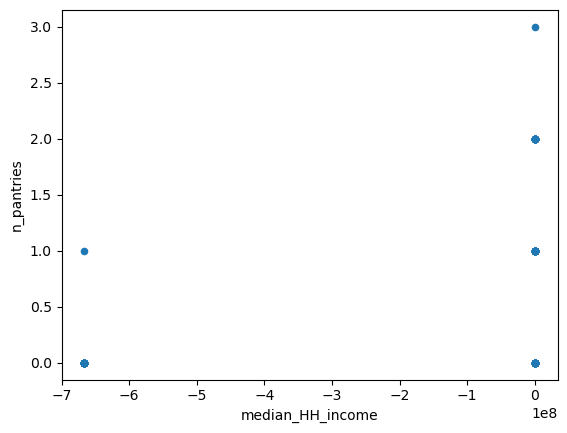

In [37]:
joinedDf.plot.scatter('median_HH_income', 'n_pantries')

What is the problem here? Look at the x-axis scale.

We can plot the distribution of income to diagnose the problem.

<Axes: >

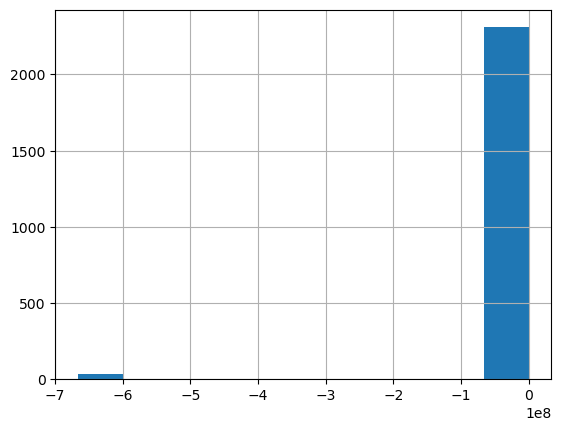

In [38]:
joinedDf.median_HH_income.hist()

Aha. Some of the income values are negative. This is often used to denote missing data. So let's replace these with null values.

<Axes: >

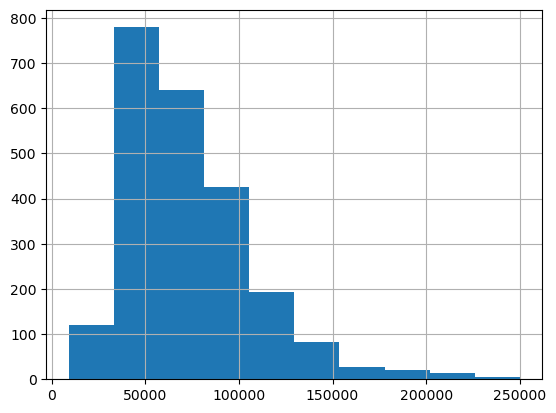

In [39]:
#「.loc[joinedDf.median_HH_income<0, 'median_HH_income']」は、
#「median_HH_income が 0 未満の行」の `‘median_HH_income’ 列を取り出す」という意味
#「joinedDf.median_HH_income < 0」はブールマスク、と呼ばれるもので、joinedDf['median_HH_income']が負の値かどうかを判定
#これによって
#0     False
#1     True     ← この行は中央値が負なので対象になる
#2     False
#3     True
#というような結果が返ってくる

#次に、.loc[] は、DataFrame.loc[行の条件, 列の指定]という形式で使う。
#ここでは、「収入が負になっている行」の「median_HH_income 列」を選択している、ということになる

#df.loc[行の条件, 列名] = 値は、特定の条件を満たす行・列を選んで更新できる

joinedDf.loc[joinedDf.median_HH_income<0, 'median_HH_income'] = np.nan
joinedDf.median_HH_income.hist()

This seems better. Let's try our scatter again.

<Axes: xlabel='median_HH_income', ylabel='n_pantries'>

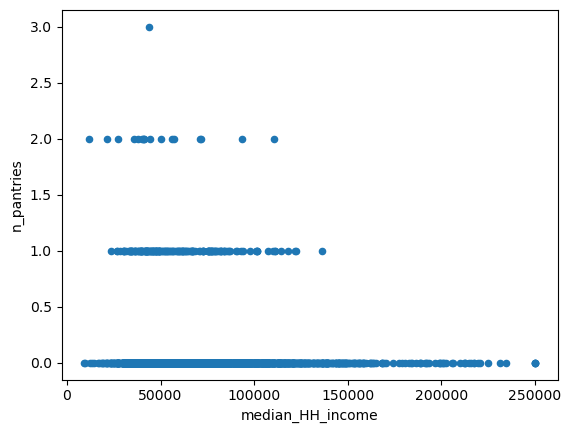

In [40]:
joinedDf.plot.scatter('median_HH_income', 'n_pantries')

Looks like there is a relationship. It would be nice to add a best fit line. `seaborn` is a library that is built on `matplotlib`, but generally makes prettier plots and has more statistical functions.

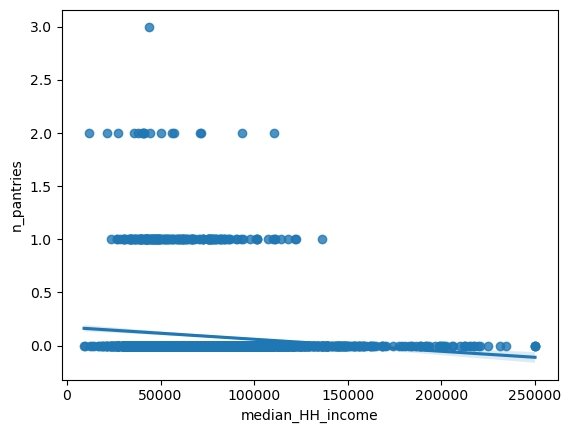

In [41]:
import seaborn as sns
#regplotというのは、回帰式の線を描くfunction。よく見ると右端の方には信頼区間も描かれているのが分かる
ax = sns.regplot(x="median_HH_income", y="n_pantries", data=joinedDf)

It looks like there is a very shallow slope. How you intepret that (need vs exclusion) is a question we can't answer with these data!

Before moving on, we can also answer the reverse question: what are the characteristics of census tracts that have no food pantries, one pantry, etc.

This is a task (again) for `groupby`. 

In [42]:
joinedDf.groupby('n_pantries').median_HH_income.mean()

n_pantries
0.0    74497.069778
1.0    60152.000000
2.0    50174.882353
3.0    43720.000000
Name: median_HH_income, dtype: float64

This looks like it would make a nice bar chart.

Text(0.5, 0, 'Number of pantries per census tract')

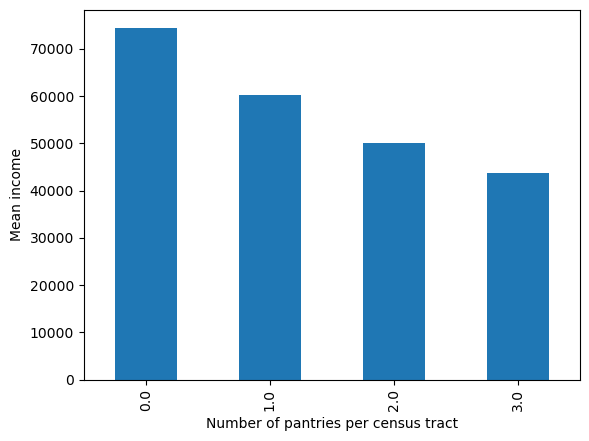

In [43]:
fig, ax = plt.subplots()
joinedDf.groupby('n_pantries').median_HH_income.mean().plot(kind='bar', ax=ax)
ax.set_ylabel('Mean income')
ax.set_xlabel('Number of pantries per census tract')

## Recap
We did a lot of join operations. Let's recap to see what we did.

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> Go step-by-step through the previous code. At each step, identify which datasets you are joining, and how (left, right, outer, inner join? On which column or spatial relationship?)
</div>

First, we joined the census data to the EnviroScreen data using `GEOID`.

<div>
   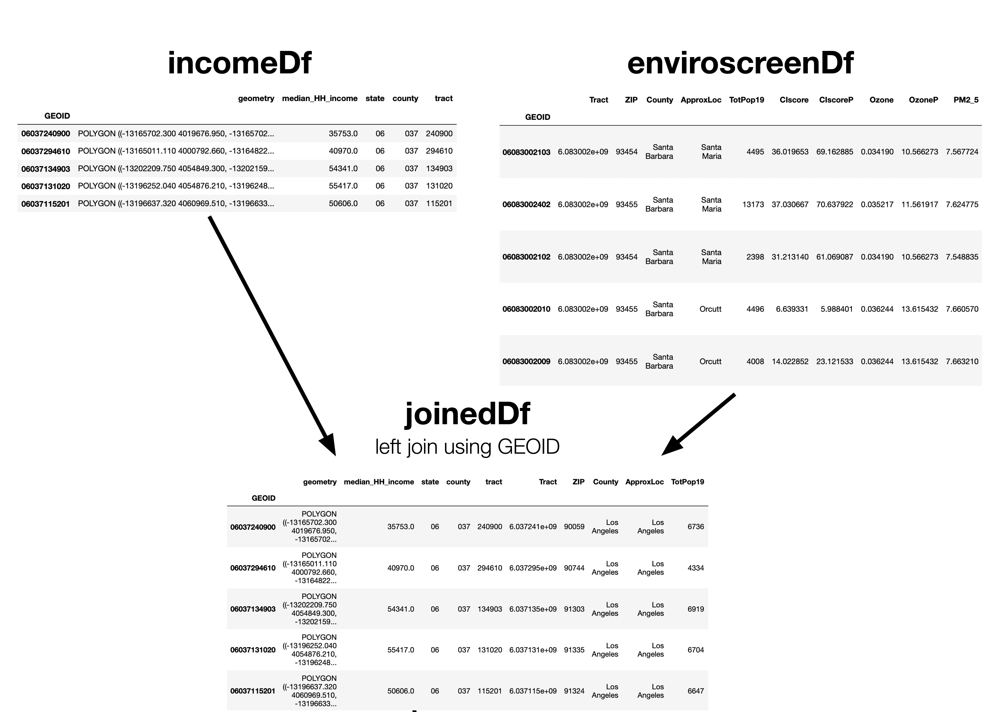
</div>

Then we did a spatial join to the pantry data.

<div>
   
</div>

Then we used `groupby` to get counts of pantries by census tract.

<div>
   
</div>

Finally, we joined those counts back to the joined EnviroScreen and census dataframe, using `GEOID`.

<div>
   
</div>

<div class="alert alert-block alert-info">
<h3>Key Takeaways</h3>
<ul>
  <li>As we saw before, data wrangling needs trial and error.</li>
  <li>Spatial joins use the spatial relationships, rather than a common column. Intersect is the most common (e.g. points inside census tracts). </li>
  <li>Seaborn is a very similar library to matplotlib, but generally makes prettier plots and has more functions for statistical charts.</li>
</ul>
</div>